# Exploratory data analysis (part 1)
EDA on Santander customer transition prediction

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import sys

In [6]:
df_train = pd.read_csv('train.csv', header = 0, index_col = 0)

# show data
* 200,000 samples in total
* each sample has 200 features
* no missing value
* all numeric values
* can be poisitive or negative

In [7]:
print(df_train.head(5))
print(df_train.info())
print(df_train.isna().sum())

         target    var_0   var_1    var_2   var_3    var_4   var_5   var_6  \
ID_code                                                                      
train_0       0   8.9255 -6.7863  11.9081  5.0930  11.4607 -9.2834  5.1187   
train_1       0  11.5006 -4.1473  13.8588  5.3890  12.3622  7.0433  5.6208   
train_2       0   8.6093 -2.7457  12.0805  7.8928  10.5825 -9.0837  6.9427   
train_3       0  11.0604 -2.1518   8.9522  7.1957  12.5846 -1.8361  5.8428   
train_4       0   9.8369 -1.4834  12.8746  6.6375  12.2772  2.4486  5.9405   

           var_7   var_8   ...     var_190  var_191  var_192  var_193  \
ID_code                    ...                                          
train_0  18.6266 -4.9200   ...      4.4354   3.9642   3.1364   1.6910   
train_1  16.5338  3.1468   ...      7.6421   7.7214   2.5837  10.9516   
train_2  14.6155 -4.9193   ...      2.9057   9.7905   1.6704   1.6858   
train_3  14.9250 -5.8609   ...      4.4666   4.7433   0.7178   1.4214   
train_4  19.251

# Data Imbalance
* total training is 200,000
* 90% data y=0, 10% data y=1 

<BarContainer object of 2 artists>

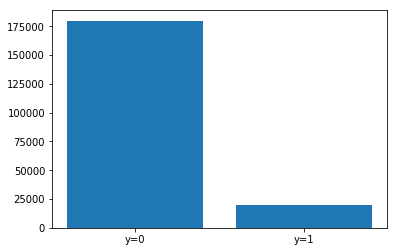

In [8]:
mask_neg = df_train.loc[:,'target']==0
mask_pos = df_train.loc[:,'target']==1
plt.bar(np.array(['y=0','y=1']),np.array([np.sum(mask_neg),np.sum(mask_pos)]))

# Analysis of correlation matrix
* correlation among features are very weak
* looks like all features are independent


In [9]:
corr_mat = df_train.corr()
off_diag = corr_mat.values-np.diag(np.diag(corr_mat.values))
print('min of correlation among features = %f' % off_diag[1:,1:].min())
print('max of correlation among features %f' % off_diag[1:,1:].max())
print('min of correlation between feature and target = %f' % off_diag[0,1:].min())
print('max of correlation between feature and target %f' % off_diag[0,1:].max())
# show correlation matrix
corr_mat.style.background_gradient(cmap='coolwarm').set_precision(2)

min of correlation among features = -0.009844
max of correlation among features 0.009714
min of correlation between feature and target = -0.080917
max of correlation between feature and target 0.066731


### correlation to target
* the value of first row of the above correlation matrix
* correlation between target of each feature is also small

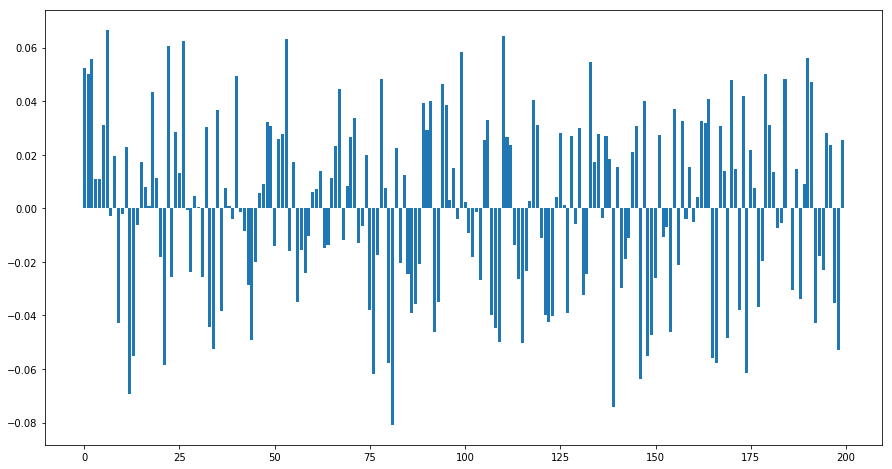

In [10]:
plt.figure(figsize = (15,8))
plt.bar(x=range(200), height = corr_mat.iloc[1:,0].values)
plt.show()

## correlation matrix of y=0 only
* correlation among features is still small when y=0

In [11]:
corr_mat = df_train.loc[mask_neg,:].corr() 
off_diag = corr_mat.values-np.diag(np.diag(corr_mat.values))
print('min of correlation among features = %f' % off_diag[1:,1:].min())
print('max of correlation among features = %f' % off_diag[1:,1:].max())
# show correlation matrix
corr_mat.style.background_gradient(cmap='coolwarm').set_precision(2)

min of correlation among features = -0.008499
max of correlation among features = 0.009523


C:\Users\Calry\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\colors.py:504: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
